# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

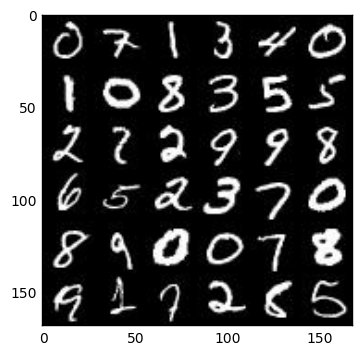

In [2]:
show_n_images = 42

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

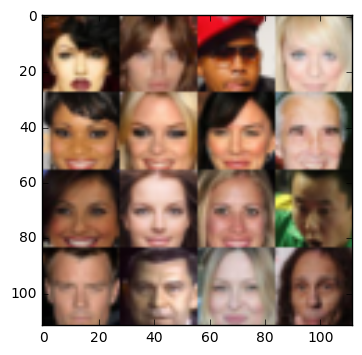

In [3]:
show_n_images = 16

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    real_inputs = tf.placeholder(tf.float32, (None, image_width, image_height,
                                              image_channels), name='real_inputs')
    z_inputs = tf.placeholder(tf.float32, (None, z_dim), name='z_inputs')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')

    return real_inputs, z_inputs, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the generator, tensor logits of the generator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        
        x1 = tf.layers.conv2d(images, 128, 5, strides=2, padding='same')
        relu1 = tf.maximum(0.2 * x1, x1)
        
        x2 = tf.layers.conv2d(relu1, 256, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(0.2 * bn2, bn2)
        
        x3 = tf.layers.conv2d(relu2, 512, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(0.2 * bn3, bn3)
        
        flatten = tf.reshape(relu3, (-1, 4*4*512))
        logits = tf.layers.dense(flatten, 1)
        output = tf.sigmoid(logits)

    return output, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    with tf.variable_scope('generator', reuse = not(is_train)):
        
        x1 = tf.layers.dense(z, 7*7*512)
        
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        bn1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(0.2 * bn1, bn1)
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(0.2 * bn2, bn2)
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(0.2 * bn3, bn3)
        
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 3, strides=1, padding='same')
        output = tf.tanh(logits)
    
    return output


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits = d_logits_real,
            labels = tf.ones_like(d_model_real)
        )
    )
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits = d_logits_fake,
            labels = tf.zeros_like(d_model_fake)
        )
    )
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits = d_logits_fake,
            labels = tf.ones_like(d_model_fake)
        )
    )
    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    train_vars = tf.trainable_variables()
    g_vars = [v for v in train_vars if v.name.startswith('generator')]
    d_vars = [v for v in train_vars if v.name.startswith('discriminator')]
    
    g_train_opt = tf.train.AdamOptimizer(
        learning_rate = learning_rate,
        beta1 = beta1
    ).minimize(g_loss, var_list = g_vars)
    
    d_train_opt = tf.train.AdamOptimizer(
        learning_rate = learning_rate,
        beta1 = beta1
    ).minimize(d_loss, var_list = d_vars)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    _, image_width, image_height, image_channels = data_shape
    input_real, input_z, learn_rate = model_inputs(image_width, image_height, image_channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, image_channels)
    d_opt, g_opt = model_opt(d_loss, g_loss, learn_rate, beta1)
    
    counter = 0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                counter += 1
                batch_images = batch_images * 2
                
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, learn_rate: learning_rate})
                sess.run(g_opt, feed_dict={input_z: batch_z, learn_rate: learning_rate})
                
                if counter % 20 == 0:
                    # Get printout after every other epoch
                    g_training_loss = g_loss.eval({input_z: batch_z})
                    d_training_loss = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    
                    print(
                        "Epoch {}/{}...".format(epoch_i+1, epoch_count),
                        "Generator Loss: {:.4f}".format(g_training_loss),
                        "Discriminator Loss: {:.4f}...".format(d_training_loss)
                    )
                    
                if counter % 100 == 0:
                    show_generator_output(sess, 50, input_z, image_channels, data_image_mode)
    

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Generator Loss: 11.5105 Discriminator Loss: 0.5339...
Epoch 1/2... Generator Loss: 7.1780 Discriminator Loss: 0.0341...
Epoch 1/2... Generator Loss: 0.5911 Discriminator Loss: 1.7217...
Epoch 1/2... Generator Loss: 4.0328 Discriminator Loss: 2.9899...
Epoch 1/2... Generator Loss: 0.6939 Discriminator Loss: 1.2593...


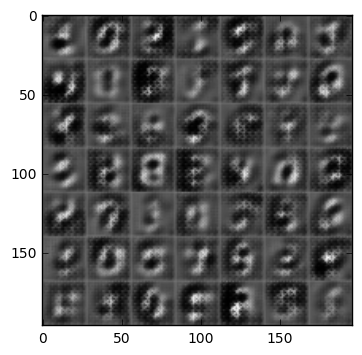

Epoch 1/2... Generator Loss: 1.1416 Discriminator Loss: 1.1389...
Epoch 1/2... Generator Loss: 1.1223 Discriminator Loss: 1.0287...
Epoch 1/2... Generator Loss: 0.5478 Discriminator Loss: 1.4631...
Epoch 1/2... Generator Loss: 0.4235 Discriminator Loss: 1.3895...
Epoch 1/2... Generator Loss: 1.2451 Discriminator Loss: 0.9527...


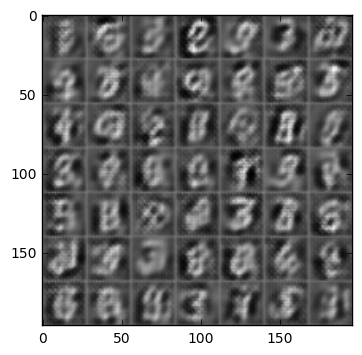

Epoch 1/2... Generator Loss: 0.7489 Discriminator Loss: 1.1556...
Epoch 1/2... Generator Loss: 2.0179 Discriminator Loss: 1.1150...
Epoch 1/2... Generator Loss: 0.5952 Discriminator Loss: 1.1322...
Epoch 1/2... Generator Loss: 0.3990 Discriminator Loss: 1.5143...
Epoch 1/2... Generator Loss: 0.6432 Discriminator Loss: 1.0512...


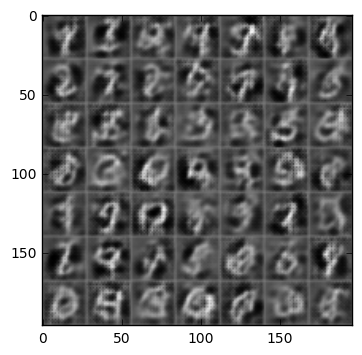

Epoch 1/2... Generator Loss: 0.7903 Discriminator Loss: 0.9567...
Epoch 1/2... Generator Loss: 0.6125 Discriminator Loss: 1.1502...
Epoch 1/2... Generator Loss: 0.5148 Discriminator Loss: 1.2644...
Epoch 1/2... Generator Loss: 1.2326 Discriminator Loss: 0.9771...
Epoch 1/2... Generator Loss: 0.7818 Discriminator Loss: 0.9785...


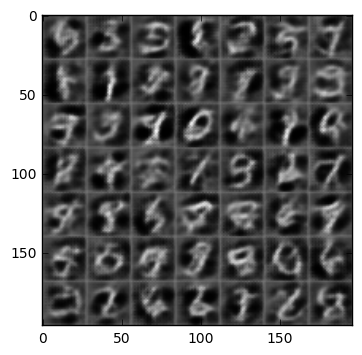

Epoch 1/2... Generator Loss: 0.2324 Discriminator Loss: 1.8956...
Epoch 1/2... Generator Loss: 0.2645 Discriminator Loss: 1.7153...
Epoch 1/2... Generator Loss: 1.8254 Discriminator Loss: 0.9539...
Epoch 1/2... Generator Loss: 0.2144 Discriminator Loss: 1.8690...
Epoch 1/2... Generator Loss: 0.9429 Discriminator Loss: 1.0203...


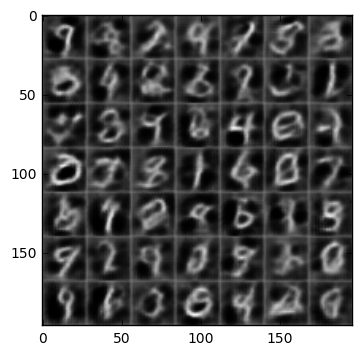

Epoch 1/2... Generator Loss: 1.6396 Discriminator Loss: 1.0777...
Epoch 1/2... Generator Loss: 3.3378 Discriminator Loss: 2.0707...
Epoch 1/2... Generator Loss: 1.0934 Discriminator Loss: 0.8667...
Epoch 1/2... Generator Loss: 1.2327 Discriminator Loss: 1.0036...
Epoch 1/2... Generator Loss: 1.2939 Discriminator Loss: 1.1724...


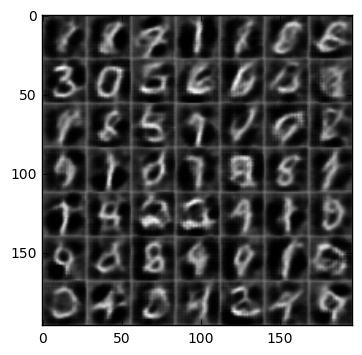

Epoch 1/2... Generator Loss: 0.6667 Discriminator Loss: 1.0617...
Epoch 1/2... Generator Loss: 1.9958 Discriminator Loss: 1.1416...
Epoch 1/2... Generator Loss: 0.9201 Discriminator Loss: 0.9211...
Epoch 1/2... Generator Loss: 0.4119 Discriminator Loss: 1.3450...
Epoch 1/2... Generator Loss: 1.1987 Discriminator Loss: 1.0158...


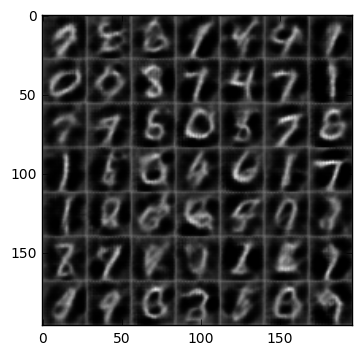

Epoch 1/2... Generator Loss: 1.0088 Discriminator Loss: 0.8710...
Epoch 1/2... Generator Loss: 0.9601 Discriminator Loss: 1.1633...
Epoch 1/2... Generator Loss: 0.6925 Discriminator Loss: 1.1367...
Epoch 1/2... Generator Loss: 1.0681 Discriminator Loss: 1.0749...
Epoch 1/2... Generator Loss: 0.4961 Discriminator Loss: 1.2235...


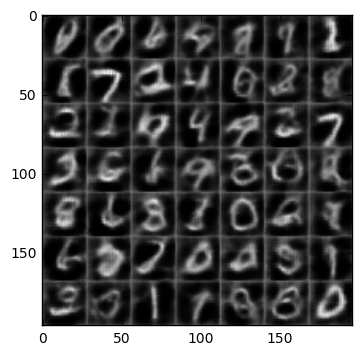

Epoch 1/2... Generator Loss: 2.2681 Discriminator Loss: 1.2623...
Epoch 1/2... Generator Loss: 0.7407 Discriminator Loss: 1.2525...
Epoch 1/2... Generator Loss: 0.7899 Discriminator Loss: 1.0491...
Epoch 1/2... Generator Loss: 0.9325 Discriminator Loss: 0.8826...
Epoch 1/2... Generator Loss: 0.7906 Discriminator Loss: 1.0333...


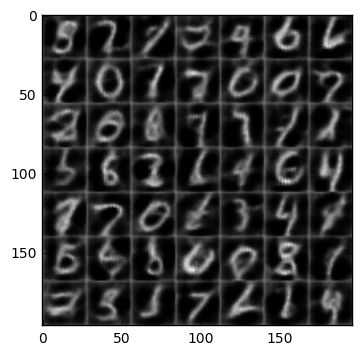

Epoch 1/2... Generator Loss: 0.5959 Discriminator Loss: 1.1441...
Epoch 2/2... Generator Loss: 0.3480 Discriminator Loss: 1.5707...
Epoch 2/2... Generator Loss: 1.0126 Discriminator Loss: 0.9898...
Epoch 2/2... Generator Loss: 1.2002 Discriminator Loss: 0.8139...
Epoch 2/2... Generator Loss: 0.4662 Discriminator Loss: 1.4592...


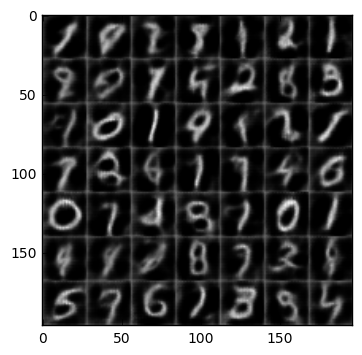

Epoch 2/2... Generator Loss: 0.6141 Discriminator Loss: 1.2021...
Epoch 2/2... Generator Loss: 1.5558 Discriminator Loss: 0.9005...
Epoch 2/2... Generator Loss: 0.4944 Discriminator Loss: 1.2707...
Epoch 2/2... Generator Loss: 2.1587 Discriminator Loss: 1.0237...
Epoch 2/2... Generator Loss: 0.3763 Discriminator Loss: 1.5080...


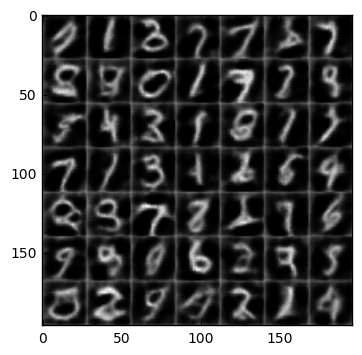

Epoch 2/2... Generator Loss: 0.9348 Discriminator Loss: 0.9597...
Epoch 2/2... Generator Loss: 0.5879 Discriminator Loss: 1.2178...
Epoch 2/2... Generator Loss: 0.5243 Discriminator Loss: 1.2411...
Epoch 2/2... Generator Loss: 0.9660 Discriminator Loss: 0.9332...
Epoch 2/2... Generator Loss: 0.8743 Discriminator Loss: 0.8947...


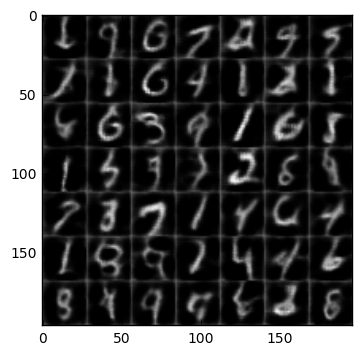

Epoch 2/2... Generator Loss: 0.3313 Discriminator Loss: 2.0558...
Epoch 2/2... Generator Loss: 0.8143 Discriminator Loss: 1.0300...
Epoch 2/2... Generator Loss: 1.2613 Discriminator Loss: 0.9204...
Epoch 2/2... Generator Loss: 0.6868 Discriminator Loss: 1.0515...
Epoch 2/2... Generator Loss: 1.0057 Discriminator Loss: 0.9094...


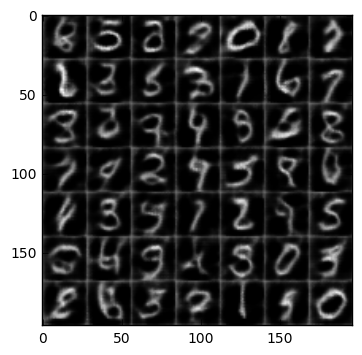

Epoch 2/2... Generator Loss: 1.8130 Discriminator Loss: 0.9785...
Epoch 2/2... Generator Loss: 0.7012 Discriminator Loss: 1.0615...
Epoch 2/2... Generator Loss: 1.3352 Discriminator Loss: 0.9753...
Epoch 2/2... Generator Loss: 0.6058 Discriminator Loss: 1.1487...
Epoch 2/2... Generator Loss: 0.9465 Discriminator Loss: 0.8321...


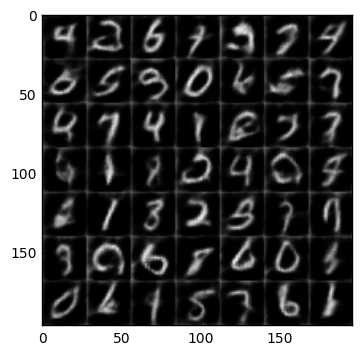

Epoch 2/2... Generator Loss: 0.5309 Discriminator Loss: 1.3007...
Epoch 2/2... Generator Loss: 0.8630 Discriminator Loss: 0.7714...
Epoch 2/2... Generator Loss: 1.0393 Discriminator Loss: 0.8519...
Epoch 2/2... Generator Loss: 2.0200 Discriminator Loss: 0.9540...
Epoch 2/2... Generator Loss: 0.3416 Discriminator Loss: 1.6324...


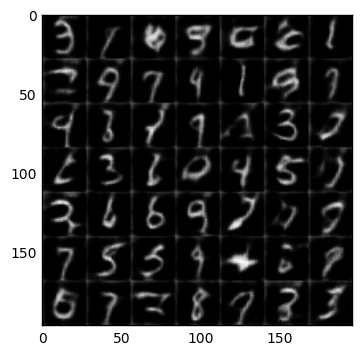

Epoch 2/2... Generator Loss: 0.5076 Discriminator Loss: 1.3577...
Epoch 2/2... Generator Loss: 3.3079 Discriminator Loss: 1.9409...
Epoch 2/2... Generator Loss: 0.6163 Discriminator Loss: 1.1376...
Epoch 2/2... Generator Loss: 0.6563 Discriminator Loss: 1.0990...
Epoch 2/2... Generator Loss: 0.9018 Discriminator Loss: 0.7659...


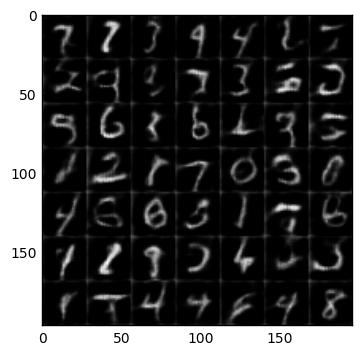

Epoch 2/2... Generator Loss: 1.9552 Discriminator Loss: 1.0814...
Epoch 2/2... Generator Loss: 1.5887 Discriminator Loss: 0.7734...
Epoch 2/2... Generator Loss: 1.0350 Discriminator Loss: 0.8414...
Epoch 2/2... Generator Loss: 3.0105 Discriminator Loss: 1.4995...
Epoch 2/2... Generator Loss: 0.7554 Discriminator Loss: 0.9594...


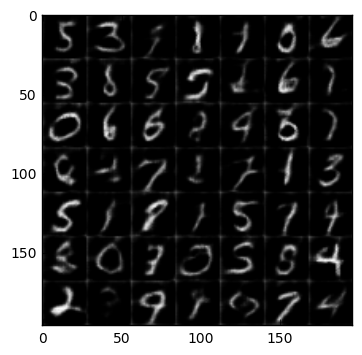

Epoch 2/2... Generator Loss: 0.6276 Discriminator Loss: 1.0480...
Epoch 2/2... Generator Loss: 2.2242 Discriminator Loss: 0.9564...
Epoch 2/2... Generator Loss: 0.8054 Discriminator Loss: 0.9970...
Epoch 2/2... Generator Loss: 0.4611 Discriminator Loss: 1.2817...
Epoch 2/2... Generator Loss: 1.4070 Discriminator Loss: 0.8408...


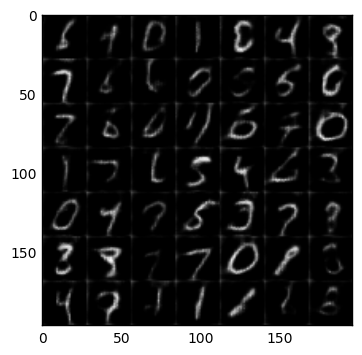

Epoch 2/2... Generator Loss: 1.5607 Discriminator Loss: 0.7904...
Epoch 2/2... Generator Loss: 0.4537 Discriminator Loss: 1.3990...
Epoch 2/2... Generator Loss: 1.2656 Discriminator Loss: 0.5282...


In [17]:
batch_size = 64
z_dim = 100
learning_rate = 0.0005
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Generator Loss: 0.2433 Discriminator Loss: 2.6269...
Epoch 1/1... Generator Loss: 10.8215 Discriminator Loss: 0.0007...
Epoch 1/1... Generator Loss: 0.8891 Discriminator Loss: 1.6953...
Epoch 1/1... Generator Loss: 0.4046 Discriminator Loss: 1.5754...
Epoch 1/1... Generator Loss: 4.1478 Discriminator Loss: 0.3110...


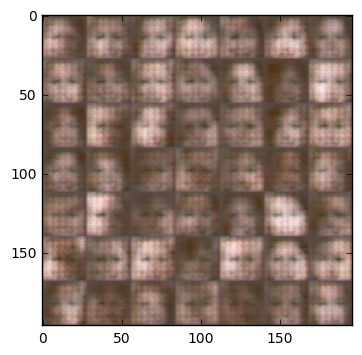

Epoch 1/1... Generator Loss: 7.7600 Discriminator Loss: 0.6799...
Epoch 1/1... Generator Loss: 1.2531 Discriminator Loss: 0.8978...
Epoch 1/1... Generator Loss: 1.2304 Discriminator Loss: 0.7292...
Epoch 1/1... Generator Loss: 1.3802 Discriminator Loss: 0.7249...
Epoch 1/1... Generator Loss: 1.5581 Discriminator Loss: 1.1700...


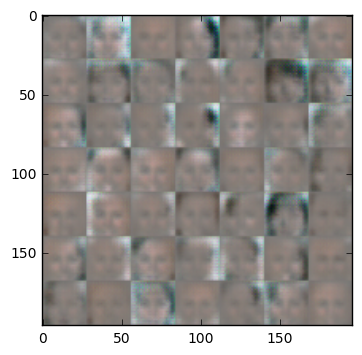

Epoch 1/1... Generator Loss: 0.8571 Discriminator Loss: 0.9132...
Epoch 1/1... Generator Loss: 2.9794 Discriminator Loss: 2.2891...
Epoch 1/1... Generator Loss: 1.2463 Discriminator Loss: 1.2795...
Epoch 1/1... Generator Loss: 0.8599 Discriminator Loss: 0.9649...
Epoch 1/1... Generator Loss: 2.2136 Discriminator Loss: 0.6345...


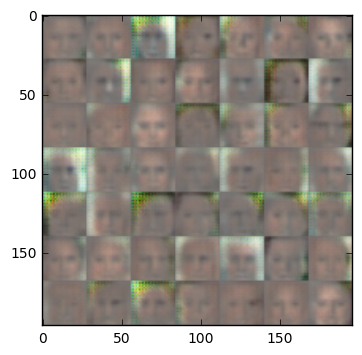

Epoch 1/1... Generator Loss: 0.9319 Discriminator Loss: 1.0882...
Epoch 1/1... Generator Loss: 0.8218 Discriminator Loss: 1.4103...
Epoch 1/1... Generator Loss: 1.8459 Discriminator Loss: 0.8773...
Epoch 1/1... Generator Loss: 1.8358 Discriminator Loss: 0.9049...
Epoch 1/1... Generator Loss: 1.1140 Discriminator Loss: 1.5094...


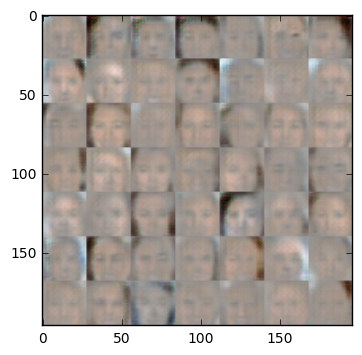

Epoch 1/1... Generator Loss: 0.8444 Discriminator Loss: 1.2203...
Epoch 1/1... Generator Loss: 0.4431 Discriminator Loss: 1.4498...
Epoch 1/1... Generator Loss: 0.6186 Discriminator Loss: 1.1594...
Epoch 1/1... Generator Loss: 0.4985 Discriminator Loss: 1.3901...
Epoch 1/1... Generator Loss: 0.8117 Discriminator Loss: 1.3350...


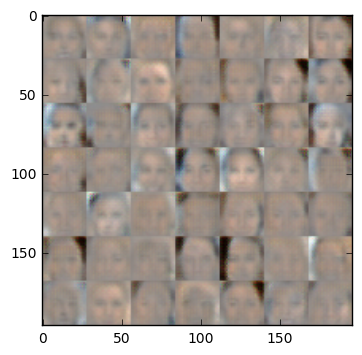

Epoch 1/1... Generator Loss: 1.3391 Discriminator Loss: 0.5265...
Epoch 1/1... Generator Loss: 1.8229 Discriminator Loss: 0.9031...
Epoch 1/1... Generator Loss: 0.5498 Discriminator Loss: 1.1663...
Epoch 1/1... Generator Loss: 0.7361 Discriminator Loss: 1.1940...
Epoch 1/1... Generator Loss: 0.4492 Discriminator Loss: 1.7010...


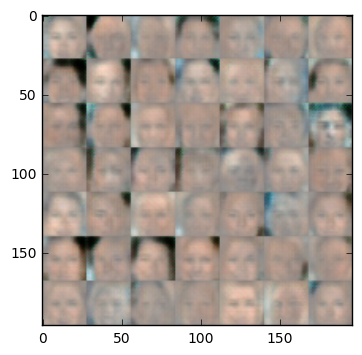

Epoch 1/1... Generator Loss: 2.9523 Discriminator Loss: 2.7532...
Epoch 1/1... Generator Loss: 0.5898 Discriminator Loss: 1.3468...
Epoch 1/1... Generator Loss: 0.8606 Discriminator Loss: 1.1170...
Epoch 1/1... Generator Loss: 1.4740 Discriminator Loss: 0.8397...
Epoch 1/1... Generator Loss: 0.7934 Discriminator Loss: 1.2464...


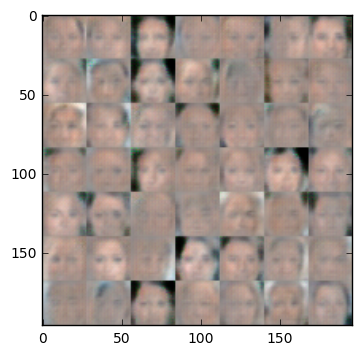

Epoch 1/1... Generator Loss: 0.7018 Discriminator Loss: 1.1551...
Epoch 1/1... Generator Loss: 0.5938 Discriminator Loss: 1.0919...
Epoch 1/1... Generator Loss: 0.6431 Discriminator Loss: 1.3774...
Epoch 1/1... Generator Loss: 0.9125 Discriminator Loss: 0.9089...
Epoch 1/1... Generator Loss: 0.4428 Discriminator Loss: 1.3829...


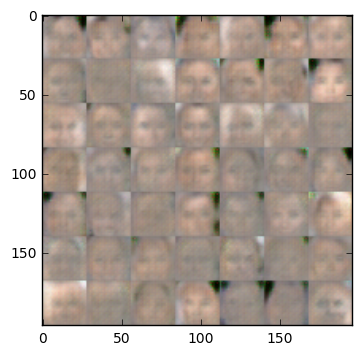

Epoch 1/1... Generator Loss: 0.9413 Discriminator Loss: 1.1566...
Epoch 1/1... Generator Loss: 0.5311 Discriminator Loss: 1.2182...
Epoch 1/1... Generator Loss: 2.1933 Discriminator Loss: 1.4155...
Epoch 1/1... Generator Loss: 0.7006 Discriminator Loss: 0.9775...
Epoch 1/1... Generator Loss: 1.2546 Discriminator Loss: 0.9155...


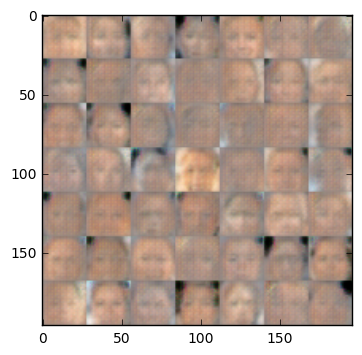

Epoch 1/1... Generator Loss: 1.3406 Discriminator Loss: 0.8965...
Epoch 1/1... Generator Loss: 2.0168 Discriminator Loss: 1.5909...
Epoch 1/1... Generator Loss: 2.5107 Discriminator Loss: 2.4275...
Epoch 1/1... Generator Loss: 1.9477 Discriminator Loss: 0.5529...
Epoch 1/1... Generator Loss: 3.8265 Discriminator Loss: 4.2679...


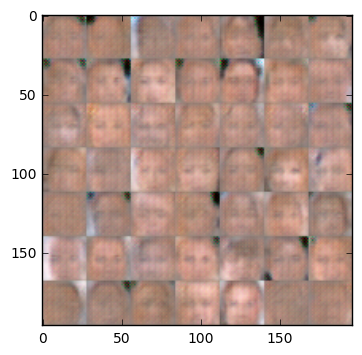

Epoch 1/1... Generator Loss: 0.8933 Discriminator Loss: 0.7916...
Epoch 1/1... Generator Loss: 2.0937 Discriminator Loss: 1.9661...
Epoch 1/1... Generator Loss: 0.8734 Discriminator Loss: 1.1535...
Epoch 1/1... Generator Loss: 0.7599 Discriminator Loss: 1.3841...
Epoch 1/1... Generator Loss: 0.7797 Discriminator Loss: 1.1048...


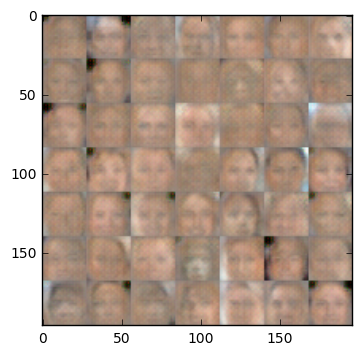

Epoch 1/1... Generator Loss: 1.7000 Discriminator Loss: 1.6156...
Epoch 1/1... Generator Loss: 1.4019 Discriminator Loss: 0.9953...
Epoch 1/1... Generator Loss: 0.7242 Discriminator Loss: 1.2851...
Epoch 1/1... Generator Loss: 0.6944 Discriminator Loss: 1.3189...
Epoch 1/1... Generator Loss: 1.5484 Discriminator Loss: 1.2937...


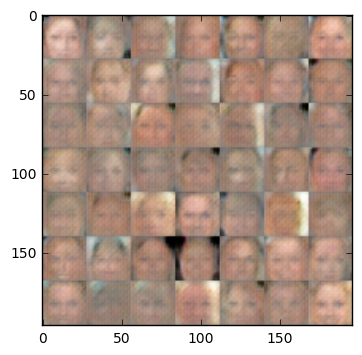

Epoch 1/1... Generator Loss: 0.2486 Discriminator Loss: 1.7156...
Epoch 1/1... Generator Loss: 1.9517 Discriminator Loss: 1.8337...
Epoch 1/1... Generator Loss: 0.7364 Discriminator Loss: 1.3445...
Epoch 1/1... Generator Loss: 2.5142 Discriminator Loss: 0.9336...
Epoch 1/1... Generator Loss: 2.9133 Discriminator Loss: 2.4763...


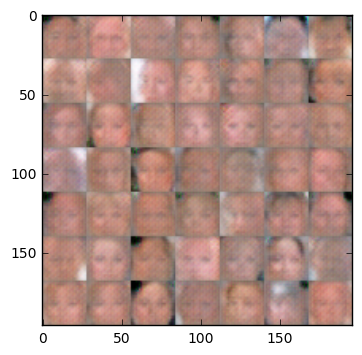

Epoch 1/1... Generator Loss: 1.3481 Discriminator Loss: 0.5248...
Epoch 1/1... Generator Loss: 0.9377 Discriminator Loss: 1.1944...
Epoch 1/1... Generator Loss: 0.9608 Discriminator Loss: 1.3364...
Epoch 1/1... Generator Loss: 0.6231 Discriminator Loss: 1.2995...
Epoch 1/1... Generator Loss: 1.3286 Discriminator Loss: 1.1686...


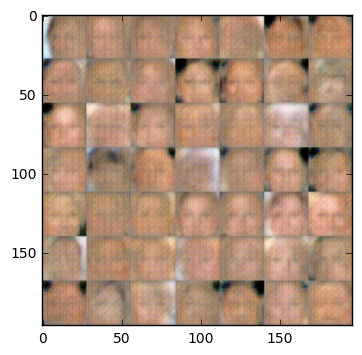

Epoch 1/1... Generator Loss: 1.7052 Discriminator Loss: 1.6960...
Epoch 1/1... Generator Loss: 0.7133 Discriminator Loss: 1.3383...
Epoch 1/1... Generator Loss: 1.5218 Discriminator Loss: 0.9277...
Epoch 1/1... Generator Loss: 0.7015 Discriminator Loss: 0.9997...
Epoch 1/1... Generator Loss: 1.7425 Discriminator Loss: 1.7174...


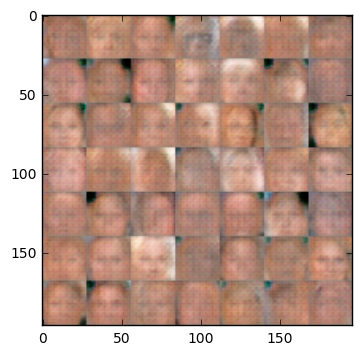

Epoch 1/1... Generator Loss: 0.7719 Discriminator Loss: 0.9913...
Epoch 1/1... Generator Loss: 0.4847 Discriminator Loss: 1.1934...
Epoch 1/1... Generator Loss: 0.4200 Discriminator Loss: 1.3456...
Epoch 1/1... Generator Loss: 0.6893 Discriminator Loss: 0.9182...
Epoch 1/1... Generator Loss: 1.5006 Discriminator Loss: 1.3597...


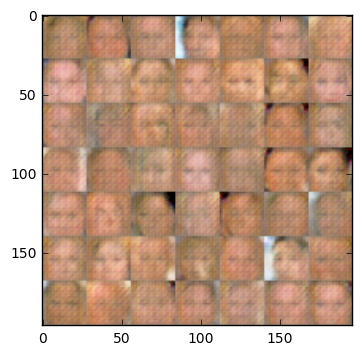

Epoch 1/1... Generator Loss: 2.4334 Discriminator Loss: 1.7557...
Epoch 1/1... Generator Loss: 0.6887 Discriminator Loss: 1.0311...
Epoch 1/1... Generator Loss: 0.6615 Discriminator Loss: 1.1844...
Epoch 1/1... Generator Loss: 0.5903 Discriminator Loss: 1.0660...
Epoch 1/1... Generator Loss: 0.3962 Discriminator Loss: 1.4226...


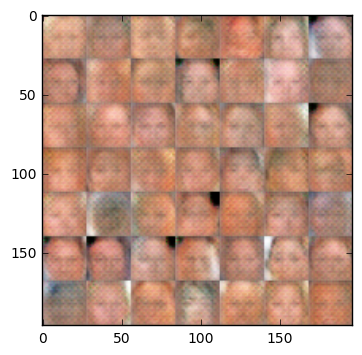

Epoch 1/1... Generator Loss: 0.8189 Discriminator Loss: 1.0837...
Epoch 1/1... Generator Loss: 0.8927 Discriminator Loss: 1.1300...
Epoch 1/1... Generator Loss: 0.7797 Discriminator Loss: 0.9916...
Epoch 1/1... Generator Loss: 0.2415 Discriminator Loss: 1.7858...
Epoch 1/1... Generator Loss: 0.0945 Discriminator Loss: 2.6071...


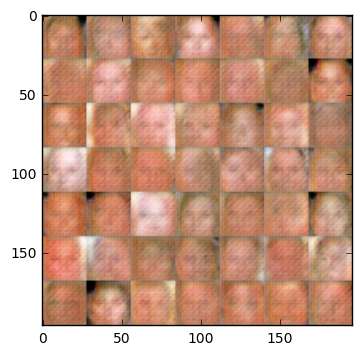

Epoch 1/1... Generator Loss: 0.6358 Discriminator Loss: 1.0646...
Epoch 1/1... Generator Loss: 0.6344 Discriminator Loss: 1.1840...
Epoch 1/1... Generator Loss: 2.2920 Discriminator Loss: 1.5113...
Epoch 1/1... Generator Loss: 0.8173 Discriminator Loss: 0.8229...
Epoch 1/1... Generator Loss: 0.8666 Discriminator Loss: 1.3069...


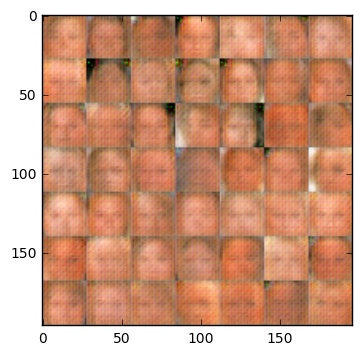

Epoch 1/1... Generator Loss: 0.6852 Discriminator Loss: 0.9780...
Epoch 1/1... Generator Loss: 0.4775 Discriminator Loss: 1.1640...
Epoch 1/1... Generator Loss: 2.8113 Discriminator Loss: 2.1941...
Epoch 1/1... Generator Loss: 0.6199 Discriminator Loss: 1.1076...
Epoch 1/1... Generator Loss: 0.4052 Discriminator Loss: 1.3738...


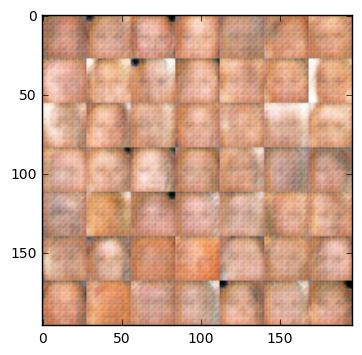

Epoch 1/1... Generator Loss: 2.4607 Discriminator Loss: 1.5477...
Epoch 1/1... Generator Loss: 2.8431 Discriminator Loss: 0.6639...
Epoch 1/1... Generator Loss: 1.3439 Discriminator Loss: 1.3927...
Epoch 1/1... Generator Loss: 0.9346 Discriminator Loss: 1.4075...
Epoch 1/1... Generator Loss: 0.9722 Discriminator Loss: 1.1795...


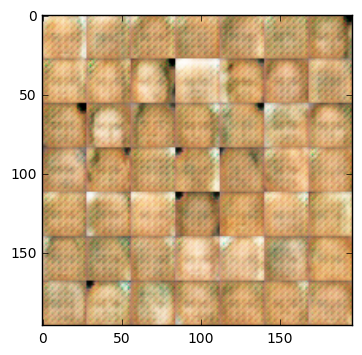

Epoch 1/1... Generator Loss: 0.3301 Discriminator Loss: 1.6501...
Epoch 1/1... Generator Loss: 0.7951 Discriminator Loss: 1.1997...
Epoch 1/1... Generator Loss: 0.9130 Discriminator Loss: 1.1738...
Epoch 1/1... Generator Loss: 1.2767 Discriminator Loss: 1.6193...
Epoch 1/1... Generator Loss: 1.1558 Discriminator Loss: 0.8764...


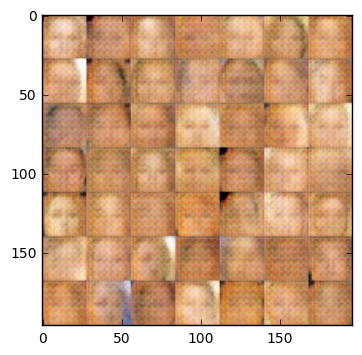

Epoch 1/1... Generator Loss: 0.1469 Discriminator Loss: 2.2795...
Epoch 1/1... Generator Loss: 0.9224 Discriminator Loss: 0.8296...
Epoch 1/1... Generator Loss: 1.0505 Discriminator Loss: 0.8250...
Epoch 1/1... Generator Loss: 2.5727 Discriminator Loss: 2.1559...
Epoch 1/1... Generator Loss: 0.6701 Discriminator Loss: 1.1784...


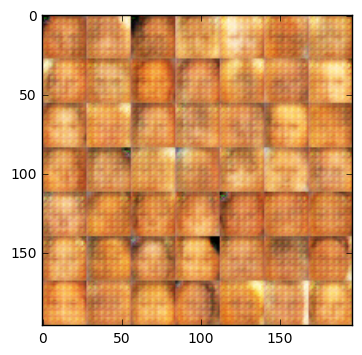

Epoch 1/1... Generator Loss: 0.6179 Discriminator Loss: 1.3064...
Epoch 1/1... Generator Loss: 1.1562 Discriminator Loss: 1.0263...
Epoch 1/1... Generator Loss: 0.8461 Discriminator Loss: 1.0930...
Epoch 1/1... Generator Loss: 0.2261 Discriminator Loss: 1.8405...
Epoch 1/1... Generator Loss: 1.8127 Discriminator Loss: 1.7007...


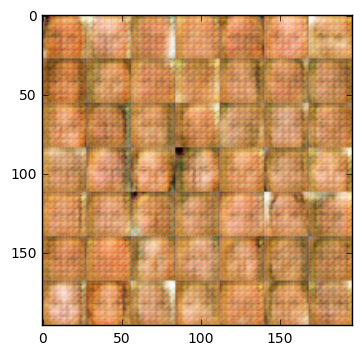

Epoch 1/1... Generator Loss: 0.5852 Discriminator Loss: 1.1499...
Epoch 1/1... Generator Loss: 2.4099 Discriminator Loss: 1.2741...
Epoch 1/1... Generator Loss: 0.6601 Discriminator Loss: 1.1362...
Epoch 1/1... Generator Loss: 0.9948 Discriminator Loss: 1.0533...
Epoch 1/1... Generator Loss: 0.7631 Discriminator Loss: 1.1230...


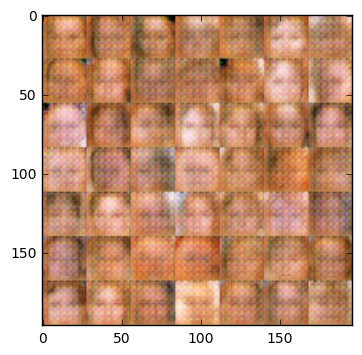

Epoch 1/1... Generator Loss: 1.2493 Discriminator Loss: 1.1648...
Epoch 1/1... Generator Loss: 0.9883 Discriminator Loss: 1.1671...
Epoch 1/1... Generator Loss: 0.4354 Discriminator Loss: 1.4026...
Epoch 1/1... Generator Loss: 1.1318 Discriminator Loss: 0.8039...
Epoch 1/1... Generator Loss: 0.6019 Discriminator Loss: 1.3147...


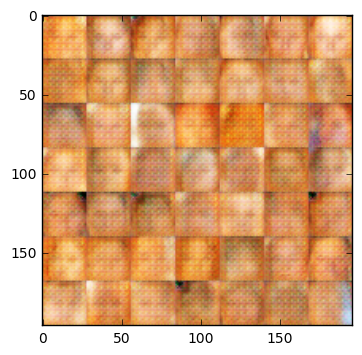

Epoch 1/1... Generator Loss: 0.5524 Discriminator Loss: 0.9940...
Epoch 1/1... Generator Loss: 1.7370 Discriminator Loss: 1.2180...
Epoch 1/1... Generator Loss: 1.2276 Discriminator Loss: 0.7422...
Epoch 1/1... Generator Loss: 2.1637 Discriminator Loss: 0.4070...
Epoch 1/1... Generator Loss: 0.8484 Discriminator Loss: 1.3519...


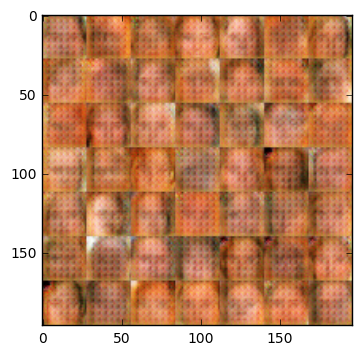

Epoch 1/1... Generator Loss: 1.4256 Discriminator Loss: 1.1311...
Epoch 1/1... Generator Loss: 0.5577 Discriminator Loss: 1.1915...
Epoch 1/1... Generator Loss: 0.9556 Discriminator Loss: 1.5479...
Epoch 1/1... Generator Loss: 0.2061 Discriminator Loss: 1.8903...
Epoch 1/1... Generator Loss: 0.4764 Discriminator Loss: 1.3003...


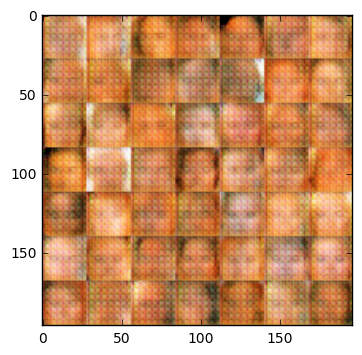

Epoch 1/1... Generator Loss: 0.5362 Discriminator Loss: 1.1624...
Epoch 1/1... Generator Loss: 0.2179 Discriminator Loss: 1.8243...
Epoch 1/1... Generator Loss: 2.1020 Discriminator Loss: 1.6849...
Epoch 1/1... Generator Loss: 0.9181 Discriminator Loss: 1.0769...
Epoch 1/1... Generator Loss: 1.7082 Discriminator Loss: 1.7066...


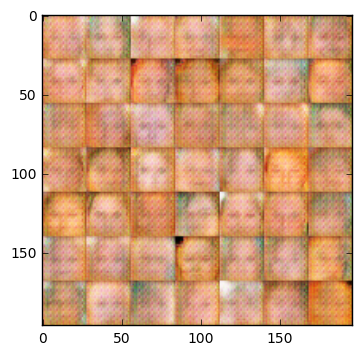

Epoch 1/1... Generator Loss: 0.9591 Discriminator Loss: 1.0771...
Epoch 1/1... Generator Loss: 1.1117 Discriminator Loss: 0.9221...
Epoch 1/1... Generator Loss: 0.7616 Discriminator Loss: 1.0164...
Epoch 1/1... Generator Loss: 1.5226 Discriminator Loss: 0.9069...
Epoch 1/1... Generator Loss: 2.6352 Discriminator Loss: 1.7192...


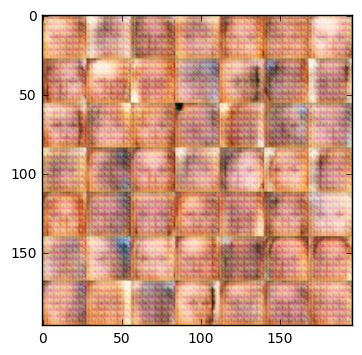

Epoch 1/1... Generator Loss: 0.6742 Discriminator Loss: 1.1264...
Epoch 1/1... Generator Loss: 0.8357 Discriminator Loss: 1.2002...
Epoch 1/1... Generator Loss: 0.5145 Discriminator Loss: 1.2022...
Epoch 1/1... Generator Loss: 1.6781 Discriminator Loss: 1.0764...
Epoch 1/1... Generator Loss: 0.6573 Discriminator Loss: 1.0976...


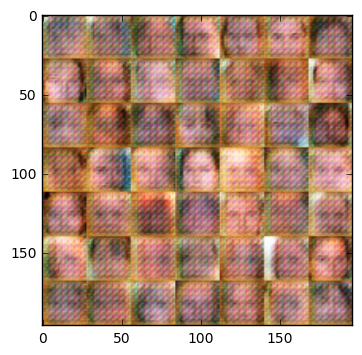

Epoch 1/1... Generator Loss: 0.8404 Discriminator Loss: 1.0710...
Epoch 1/1... Generator Loss: 1.3988 Discriminator Loss: 1.0678...
Epoch 1/1... Generator Loss: 0.9845 Discriminator Loss: 0.8440...


In [12]:
batch_size = 64
z_dim = 100
learning_rate = 0.0005
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.